
# Lab 3 Spatial operations, part 1

### Function definitions

First, we will perform the required imports.

In [1]:
import numpy as np
import skimage 
from skimage import io,filters,feature
import matplotlib.pyplot as plt
import scipy as sp
import scipy.ndimage as nd   

Next, we will define a function that, given an image, applies all three filters from both, Gaussian and median  filters.

In [2]:
def Test_filters(img):
  sizes = [3,5,7]; # Filter sizes
  fig, axs = plt.subplots(2,3,constrained_layout=True,figsize = (24,16));
  
  # Iterate all sizes
  for i,w in enumerate(sizes):
    # Average filtering
    footprint = skimage.morphology.square(w);
    average = filters.rank.mean(img, footprint);
    title = f"Average filtered image with filter size {w}x{w}.";
    axs[0,i].imshow(average, cmap="gray");
    axs[0,i].set_title(title);
    # Median filtering
    median = filters.rank.median(img, footprint);
    title = f"Median filtered image with filter size {w}x{w}.";
    axs[1,i].imshow(median, cmap="gray");
    axs[1,i].set_title(title);
  
  plt.show();

Let us retrieve the data (images) from a dropbox source. 

In [3]:
!rm -fr sample_data
!wget -q -O coins.png https://www.dropbox.com/s/ycblj50vob05a09/coins.png?dl=0
!wget -q -O church.tif https://www.dropbox.com/s/pqjxw0n5u99d49l/church.tif?dl=0
!wget -q -O peppers.png https://www.dropbox.com/s/768g9ric6cqls10/peppers.png?dl=0
!wget -q -O rice.png https://www.dropbox.com/s/12s5jy9cs8yukch/rice.png?dl=0
!wget -q -O saturn.png https://www.dropbox.com/s/e32rz4ywah4mi5h/saturn.png?dl=0


'rm' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


We proceed to load the 'coins.png' image and add some salt&pepper (s&p) noise. 

coins is of shape 246x300


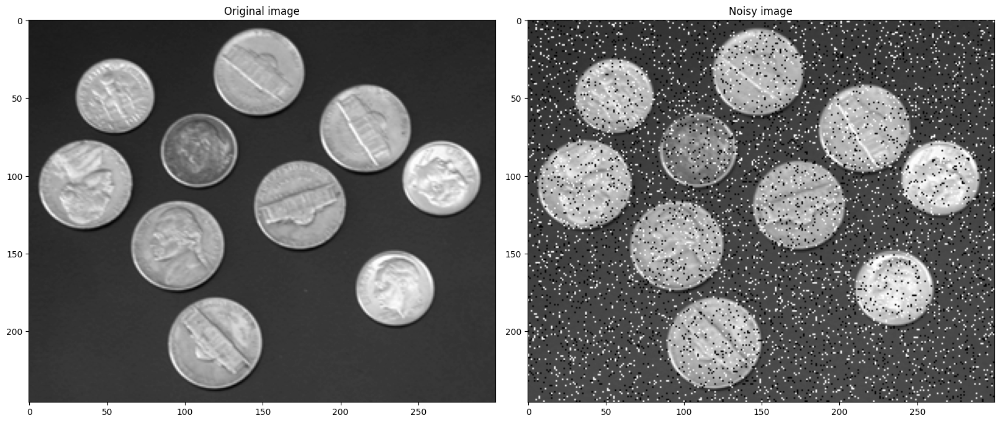

In [4]:
# Load image in a gray scale format
coins = io.imread('coins.png', as_gray=True);
m,n = coins.shape;
print(f'coins is of shape {m}x{n}');

coins_s_n_p = skimage.util.random_noise(coins, mode='s&p', amount=0.1);

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Original image";
axs[0].imshow(coins, cmap="gray");
axs[0].set_title(title);
title = "Noisy image";
axs[1].imshow(coins_s_n_p, cmap="gray");
axs[1].set_title(title);


Calling our function, we will try to filter the image and analyze the results:

C:\Users\idosh\AppData\Local\Temp\ipykernel_37224\3878590733.py:1: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  Test_filters(coins_s_n_p)


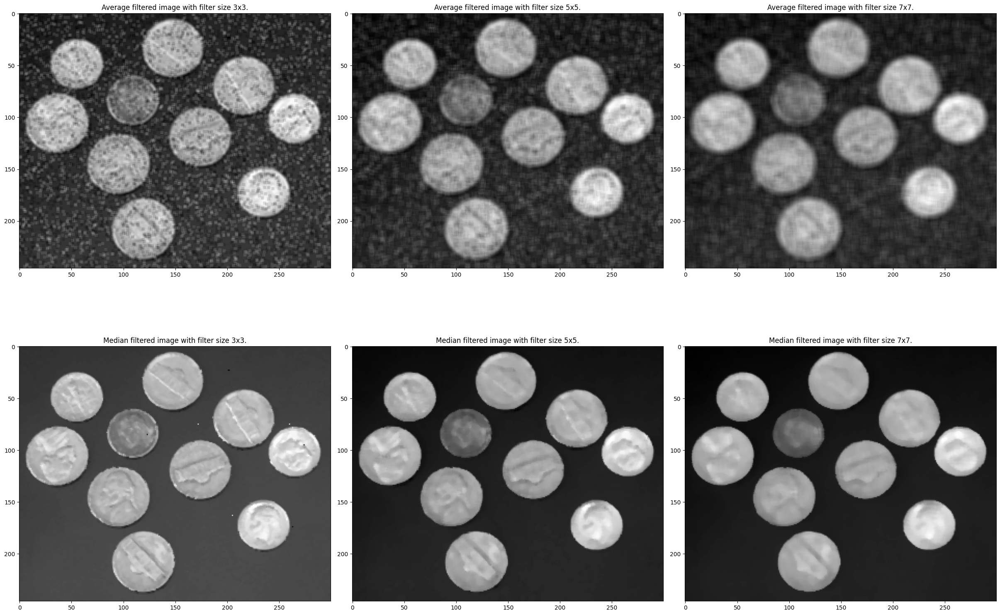

In [5]:
Test_filters(coins_s_n_p)

We can see that the Averaging filter blurs the edges. The $7\times7$ filter does not satisfyingly clean the image, but significantly reduces the quality of the image. However, the median filter removes most of the noise even using a $3\times3$ filter, while causing less harm to edges. It seems that the best filter for this case is either the $3\times3$ median filter, which almost completes the job, leaving a very small number of noise points, or the $5\times5$ median filter, which eliminates all the noise points but blurs the edges a bit more. The decision will depand on the final goal\task. 

We proceed to add a Gaussian noise $\mathcal{N}\sim(\mu,\sigma^2)$ to the 'peppers.png' image. We will use the values $\mu=0$, and $\sigma^2=0.01$.

coins is of shape 246x300


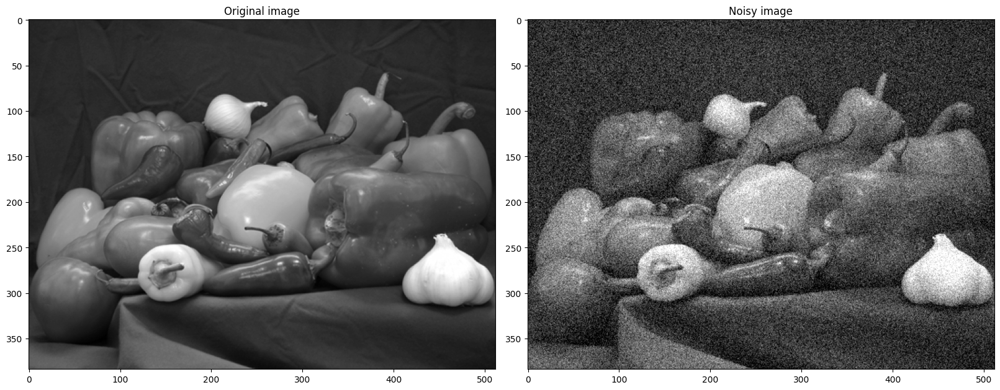

In [6]:
# Load image in a gray scale format
peppers = io.imread('peppers.png', as_gray=True);
m,n = coins.shape;
print(f'coins is of shape {m}x{n}');

peppers_g = skimage.util.random_noise(peppers, mode='gaussian', mean = 0, var = 0.01);

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Original image";
axs[0].imshow(peppers, cmap="gray");
axs[0].set_title(title);
title = "Noisy image";
axs[1].imshow(peppers_g, cmap="gray");
axs[1].set_title(title);

We repeat the filtering evaluation on the new noised image:

C:\Users\idosh\AppData\Local\Temp\ipykernel_37224\865114346.py:1: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  Test_filters(peppers_g)


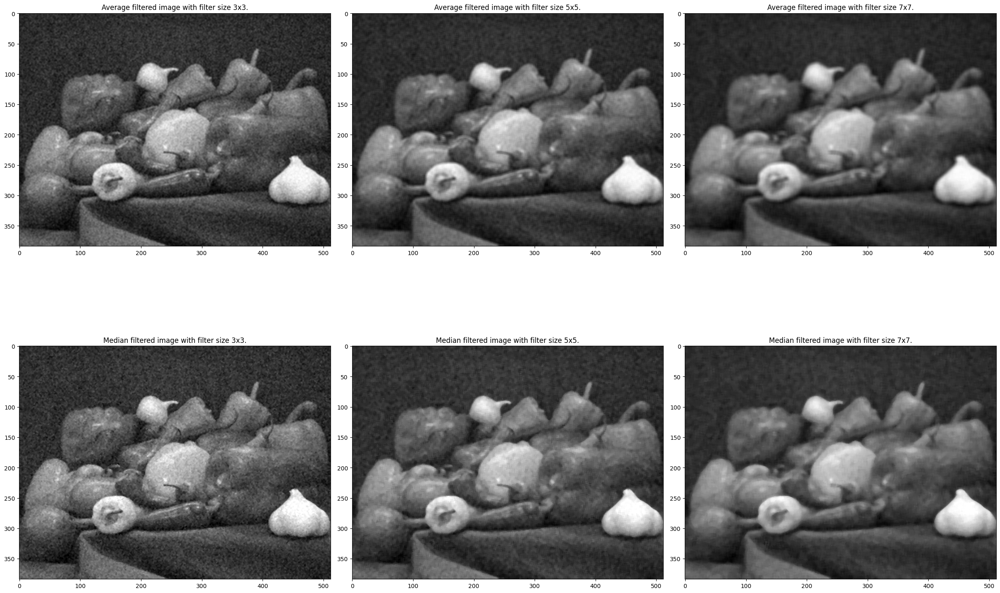

In [7]:
Test_filters(peppers_g)

Both filters do a similar job in the case of Gaussian noise. None of them can remove the noise completely, and both of them blur the image. Careful observation can tell that the median preserves better edges, as can be seen in the $7\times7$ case. 

Now let us load the 'saturn.png' and 'rice.png' images and add an S&P noise to both of them with an amount of 0.7.

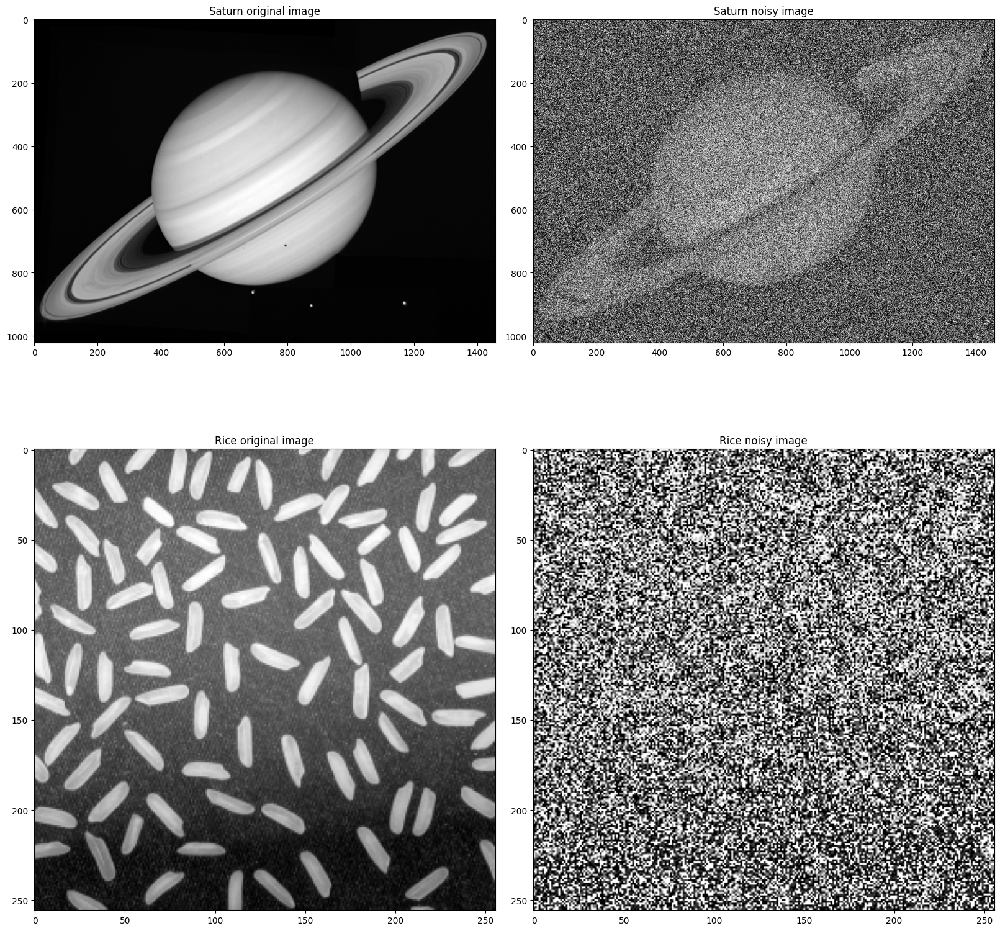

In [8]:
# Load image in a gray scale format
saturn = io.imread('saturn.png', as_gray=True);
rice = io.imread('rice.png', as_gray=True);

saturn_s_n_p = skimage.util.random_noise(saturn, mode='s&p', amount=0.7);
rice_s_n_p = skimage.util.random_noise(rice, mode='s&p', amount=0.7);


fig, axs = plt.subplots(2,2,constrained_layout=True,figsize = (16,16));
title = "Saturn original image";
axs[0,0].imshow(saturn, cmap="gray");
axs[0,0].set_title(title);
title = "Saturn noisy image";
axs[0,1].imshow(saturn_s_n_p, cmap="gray");
axs[0,1].set_title(title);

title = "Rice original image";
axs[1,0].imshow(rice, cmap="gray");
axs[1,0].set_title(title);
title = "Rice noisy image";
axs[1,1].imshow(rice_s_n_p, cmap="gray");
axs[1,1].set_title(title);


We note that with this amount of noise, it is very hard to make out the rice after adding the noise. The Saturn image is clearer after adding the noise. We will apply a $7\times7$ median filter to both, and analyze the result:

c:\Users\idosh\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\interactiveshell.py:3433: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


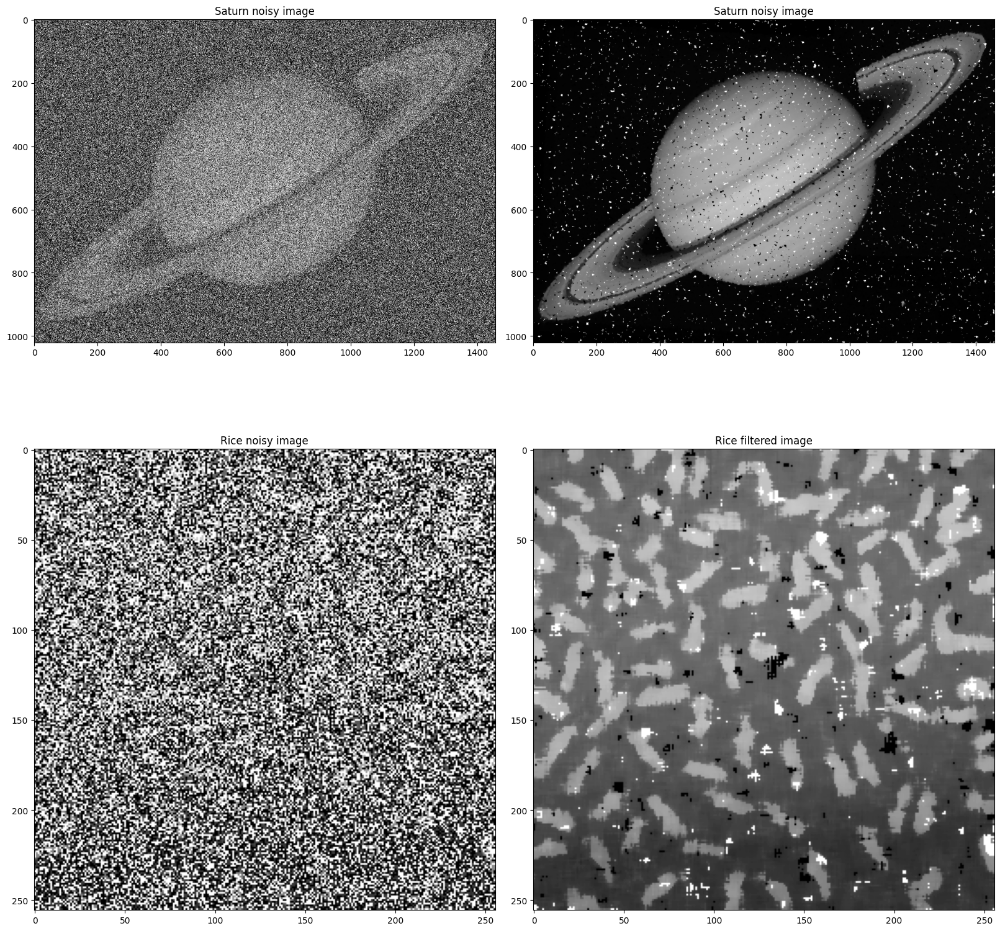

In [9]:
footprint = skimage.morphology.square(7);
saturn_median = filters.rank.median(saturn_s_n_p, footprint);
rice_median = filters.rank.median(rice_s_n_p, footprint);


fig, axs = plt.subplots(2,2,constrained_layout=True,figsize = (16,16));
title = "Saturn noisy image";
axs[0,0].imshow(saturn_s_n_p, cmap="gray");
axs[0,0].set_title(title);
title = "Saturn noisy image";
axs[0,1].imshow(saturn_median, cmap="gray");
axs[0,1].set_title(title);

title = "Rice noisy image";
axs[1,0].imshow(rice_s_n_p, cmap="gray");
axs[1,0].set_title(title);
title = "Rice filtered image";
axs[1,1].imshow(rice_median, cmap="gray");
axs[1,1].set_title(title);

The Saturn image looks closer to the original after the filtering process. The gradient in the background of the rice image is somewhat restored. The size of the filter considering the size of the rice grains is problematic. A median filter seems to perform badly when the size of the objects in the image is too close to the size of the filter itself.

Let us open the 'church.tif', and observe the edges a little. 

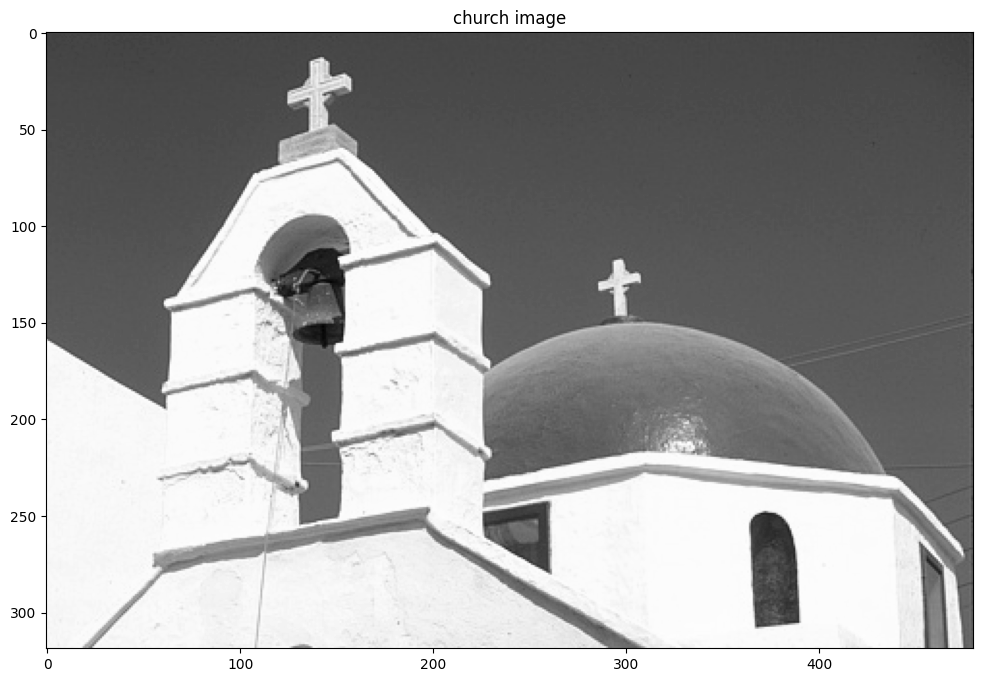

In [10]:
# Load image in a gray scale format
church = io.imread('church.tif', as_gray=True);

peppers_g = skimage.util.random_noise(peppers, mode='gaussian', mean = 0, var = 0.01);

fig = plt.figure(figsize = (16,8));
title = "church image";
plt.imshow(church, cmap="gray");
plt.title(title);

We can see the edges of some straight lines, as well as the rounded dome on the back. Some straight lines are diagonal and some are closer to being aligned with the $x$ and $y$ axes. Some are thin and some are wider. The thinner and rounder edges will be the hardest to detect. Let us apply a Sobel filter to the images:

(319, 480)


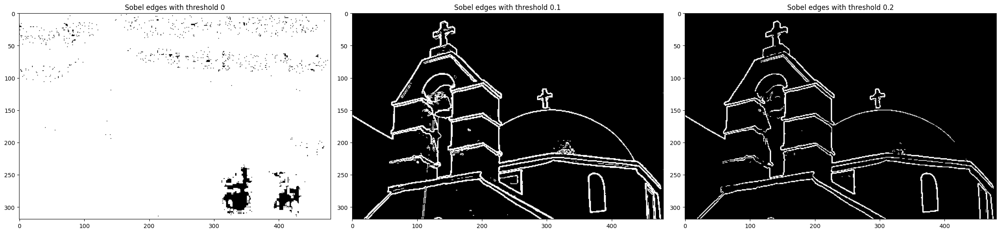

In [11]:
church_sobel = filters.sobel(church);
print(church_sobel.shape)
church_sobel_0 = np.zeros(church_sobel.shape);
church_sobel_0_1 = np.zeros(church_sobel.shape);
church_sobel_0_2 = np.zeros(church_sobel.shape);
church_sobel_0[church_sobel>0] = 1;
church_sobel_0_1[church_sobel>0.1] = 1;
church_sobel_0_2[church_sobel>0.2] = 1;

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Sobel edges with threshold 0";
axs[0].imshow(church_sobel_0, cmap="gray");
axs[0].set_title(title);
title = "Sobel edges with threshold 0.1";
axs[1].imshow(church_sobel_0_1, cmap="gray");
axs[1].set_title(title);
title = "Sobel edges with threshold 0.2";
axs[2].imshow(church_sobel_0_2, cmap="gray");
axs[2].set_title(title);


The best result is the 0.1 thresholding. The 0 thresholding performs poorly, passing almost anything as an edge. This results in a very white image with no true information on the edges. The 0.2 value is too strong thresholding, cutting through the dome outline, the thin rope, and some of the thinner lines in the left pillar bottom. The 0.1 value, retains most of the edges better than the other values. It even captures the sun's glare on the bottom of the dome. We will try and evaluate the edges given by the `LofG` operation. 

We will repeat the previous step for the `LofG` operator. First, let us define a function for `LofG`:

In [12]:
def LofG(img,sigma=1., thresh=0.1):
    LoG = nd.gaussian_laplace(img.astype(float),sigma)        # Calculate LoG image
    th = 10*np.absolute(LoG).mean()*thresh              # Calculate threshold
    output = np.zeros(LoG.shape)
    w = output.shape[1]
    h = output.shape[0]

    for y in range(1, h - 1):
        for x in range(1, w - 1):
            patch = LoG[y-1:y+2, x-1:x+2]               # Get 3x3 patch
            if patch[1,1]<0:                            # Check all cases of [-] in the middle
                if (patch.max()>0) and (patch.max()-patch[1,1]>th):
                    output[y, x] = 1;
            elif patch[1,1]==0:
                if (np.sign(patch[0,1])*np.sign(patch[2,1])<0) and (np.absolute(patch[2,1]-patch[0,1])>th): # Check [- 0 +]', [+ 0 -]'
                    output[y, x] = 1;
                if (np.sign(patch[1,0])*np.sign(patch[1,2])<0) and (np.absolute(patch[1,2]-patch[1,0])>th): # Check [- 0 +], [+ 0 -]
                    output[y, x] = 1;
                if (np.sign(patch[0,0])*np.sign(patch[2,2])<0) and (np.absolute(patch[2,2]-patch[0,0])>th): # Check main diagonal
                    output[y, x] = 1;
                if (np.sign(patch[2,0])*np.sign(patch[0,2])<0) and (np.absolute(patch[0,2]-patch[2,0])>th): # Check inverse diagonal
                    output[y, x] = 1;
    return output

And proceed to apply the `LofG` operator with $\sigma = 0.5,1,2$.

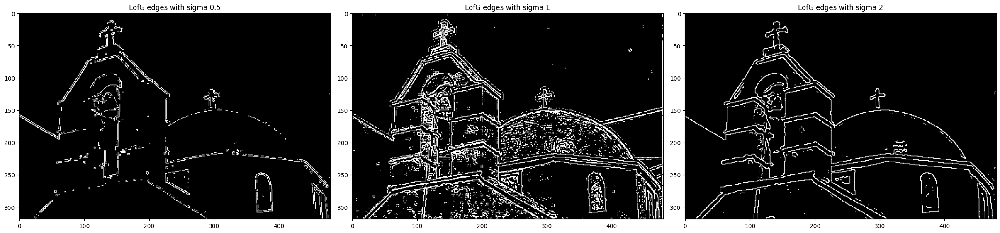

In [13]:
church_LofG_0_5 = LofG(church,0.5);
church_LofG_1 = LofG(church,1);
church_LofG_2 = LofG(church,2);

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "LofG edges with sigma 0.5";
axs[0].imshow(church_LofG_0_5, cmap="gray");
axs[0].set_title(title);
title = "LofG edges with sigma 1";
axs[1].imshow(church_LofG_1, cmap="gray");
axs[1].set_title(title);
title = "LofG edges with sigma 2";
axs[2].imshow(church_LofG_2, cmap="gray");
axs[2].set_title(title);

The best result is the $\sigma = 2$ `LofG`. For $\sigma = 0.5$ the dog operator within the `LofG` seems to be too small to detect anything, while the $\sigma = 1$ is too sensitive. The results of `LofG` with $\sigma = 2$ seem to be comparable with the Sobel operator, using 0.1 thresholding.

Let us have some trial and error with the canny algorithm. We will start with the default of $\sigma=1$ and a high threshold of $0.9$. Then, we will alter the $\sigma$ size and check for improvements. 

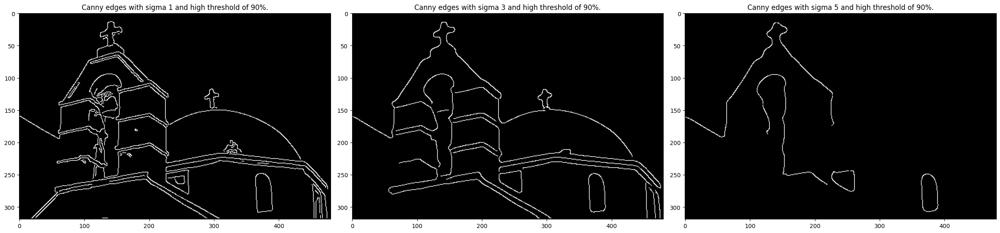

In [14]:
S = 1.0;
HT = 90;
church_canny_S_1_HT_90 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
S = 3.0;
church_canny_S_3_HT_90 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
S = 5.0;
church_canny_S_5_HT_90 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Canny edges with sigma 1 and high threshold of 90%.";
axs[0].imshow(church_canny_S_1_HT_90, cmap="gray");
axs[0].set_title(title);
title = "Canny edges with sigma 3 and high threshold of 90%.";
axs[1].imshow(church_canny_S_3_HT_90, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma 5 and high threshold of 90%.";
axs[2].imshow(church_canny_S_5_HT_90, cmap="gray");
axs[2].set_title(title);

The best results are achieved with $\sigma = 1$ and a high threshold of $90\%$. We will try to lower the threshold for better results. 

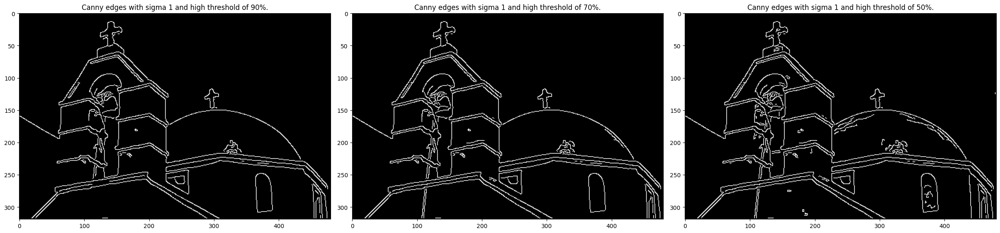

In [15]:
S = 1.0;
HT =90;
church_canny_S_1_HT_90 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
HT = 70;
church_canny_S_1_HT_70 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
HT = 50;
church_canny_S_1_HT_50 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);


fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Canny edges with sigma 1 and high threshold of 90%.";
axs[0].imshow(church_canny_S_1_HT_90, cmap="gray");
axs[0].set_title(title);
title = "Canny edges with sigma 1 and high threshold of 70%.";
axs[1].imshow(church_canny_S_1_HT_70, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma 1 and high threshold of 50%.";
axs[2].imshow(church_canny_S_1_HT_50, cmap="gray");
axs[2].set_title(title);

It seems that lower values of threshold manage to capture the diagonal wire and the dark bell beneath the arch. Let us reduce the value even more.

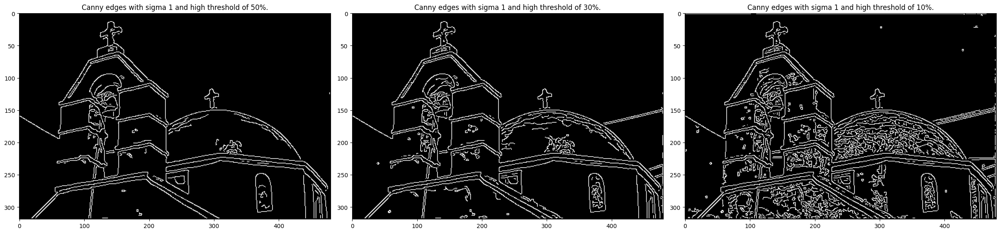

In [16]:
S = 1.0;
HT =50;
church_canny_S_1_HT_50 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
HT = 30;
church_canny_S_1_HT_30 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
HT = 10;
church_canny_S_1_HT_10 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);


fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Canny edges with sigma 1 and high threshold of 50%.";
axs[0].imshow(church_canny_S_1_HT_50, cmap="gray");
axs[0].set_title(title);
title = "Canny edges with sigma 1 and high threshold of 30%.";
axs[1].imshow(church_canny_S_1_HT_30, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma 1 and high threshold of 10%.";
axs[2].imshow(church_canny_S_1_HT_10, cmap="gray");
axs[2].set_title(title);

There is no perfect result. The texture of the dome is starting to show in the $30\%$ thresholding value. The bell is too dark to produce good edges. Depending on the task at hand, the optimal parameters are somewhere in the region of between $30\%$ and $50\%$. We will try a last trial with the default parameters:

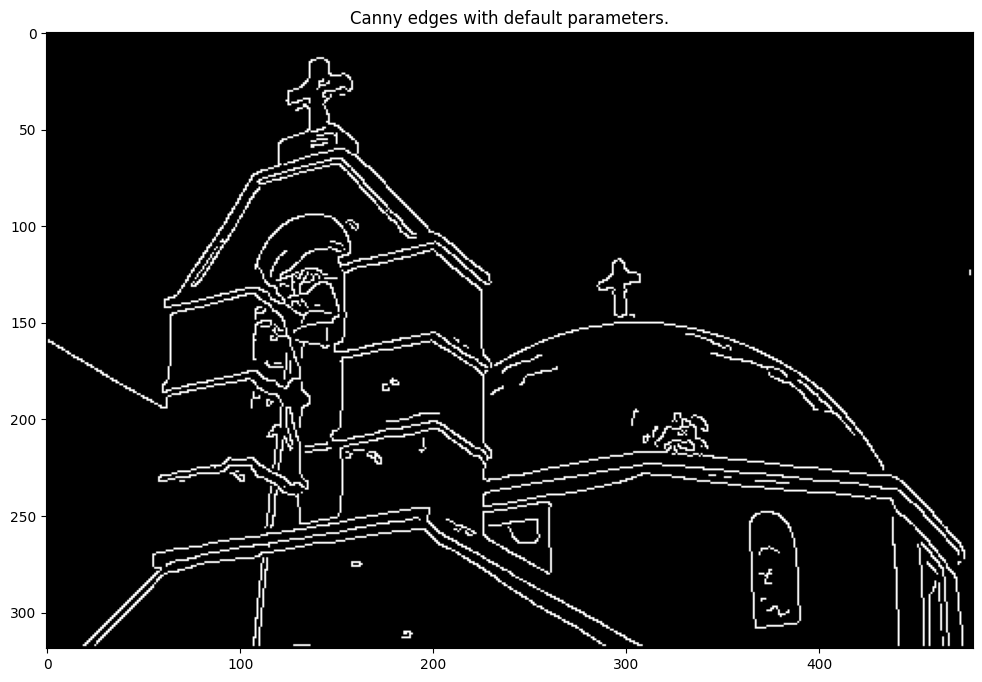

In [17]:

church_canny_default = feature.canny(church);


fig = plt.figure(figsize = (16,8));
title = "Canny edges with default parameters.";
plt.imshow(church_canny_default, cmap="gray");
plt.title(title);

The defaulted parameters look nice and similar to our $\sigma =1$, and $50%$ thresholding.

Let us compare the three methods with the requested parameters:

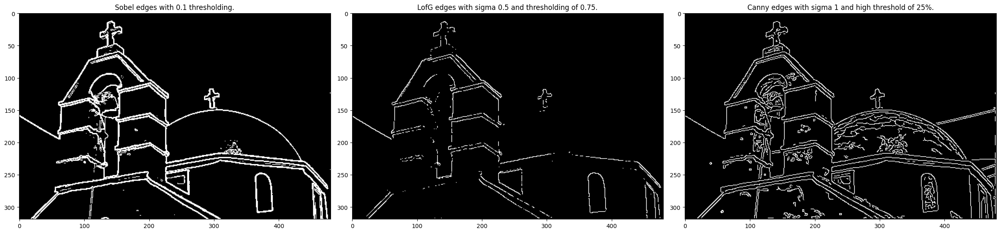

In [18]:

church_sobel = filters.sobel(church);
church_sobel_0_1 = np.zeros(church_sobel.shape);
church_sobel_0_1[church_sobel>0.1] = 1;
church_LofG_0_5 = LofG(church,1.5,0.75);
S = 1.0;
HT = 25;
church_canny_S_1_HT_25 = feature.canny(church, sigma=S, low_threshold=0.4*HT, high_threshold=HT);


fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Sobel edges with 0.1 thresholding.";
axs[0].imshow(church_sobel_0_1, cmap="gray");
axs[0].set_title(title);
title = "LofG edges with sigma 0.5 and thresholding of 0.75.";
axs[1].imshow(church_LofG_0_5, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma 1 and high threshold of 25%.";
axs[2].imshow(church_canny_S_1_HT_25, cmap="gray");
axs[2].set_title(title);

The Sobel operator seems to give clean and clear edges, preserving the string and restoring the edges of the bell as best as possible. The `LofG` algorithm yields fragmented lines. This is probably due to the high threshold. The canny algorithm is very susceptible to small details. It creates some artifacts created to be the texture. In most cases, these would be unwanted noise. Depending on the task, the Sobel operator seems to be the best for most cases. 

We proceed to add Gaussian noise to our image.

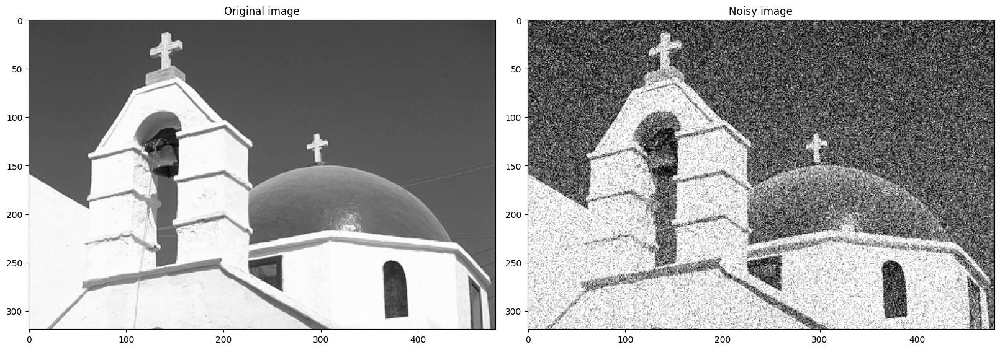

In [19]:
church_g = skimage.util.random_noise(church, mode='gaussian', mean = 0, var = 0.04);

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Original image";
axs[0].imshow(church, cmap="gray");
axs[0].set_title(title);
title = "Noisy image";
axs[1].imshow(church_g, cmap="gray");
axs[1].set_title(title);

Let's apply the previous canny parameters, thresholding of $25\%$ and $\sigma = 1$, to the noisy image. 

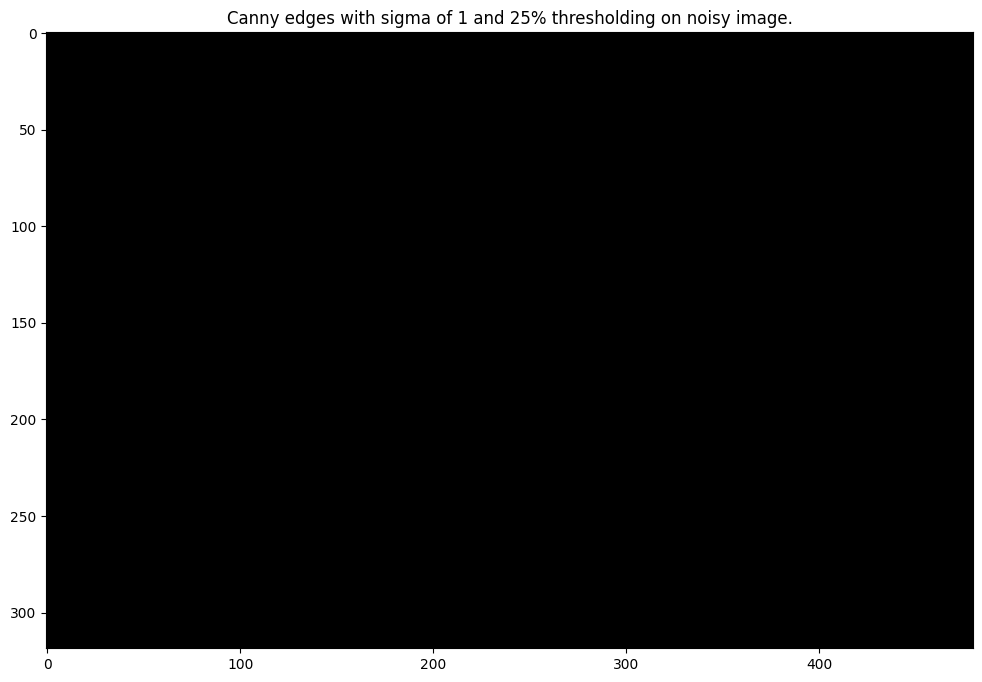

In [20]:

S = 1.0;
HT = 25;
noisy_church_canny = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);


fig = plt.figure(figsize = (16,8));
title = "Canny edges with sigma of 1 and 25% thresholding on noisy image.";
plt.imshow(noisy_church_canny, cmap="gray");
plt.title(title);

We have lost all the edges. Let us try and find a better fit. We will start with a higher $\sigma$ value:

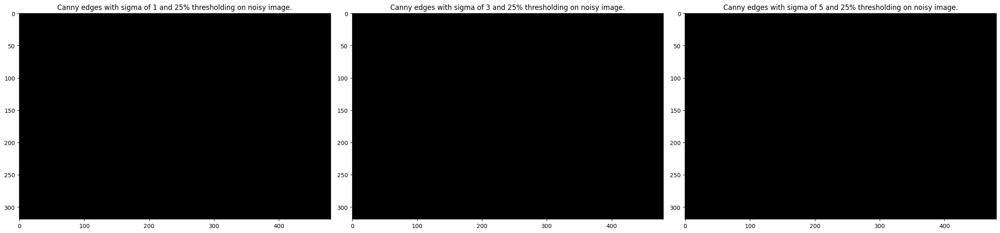

In [21]:
S = 1.0;
HT = 25;
noisy_church_canny_S_1 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
S = 3.0;
noisy_church_canny_S_3 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
S = 5.;
noisy_church_canny_S_5 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Canny edges with sigma of 1 and 25% thresholding on noisy image.";
axs[0].imshow(noisy_church_canny_S_1, cmap="gray");
axs[0].set_title(title);
title = "Canny edges with sigma of 3 and 25% thresholding on noisy image.";
axs[1].imshow(noisy_church_canny_S_3, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma of 5 and 25% thresholding on noisy image.";
axs[2].imshow(noisy_church_canny_S_5, cmap="gray");
axs[2].set_title(title);

Since this does nothing, we will try an extremely high value of $\sigma$:

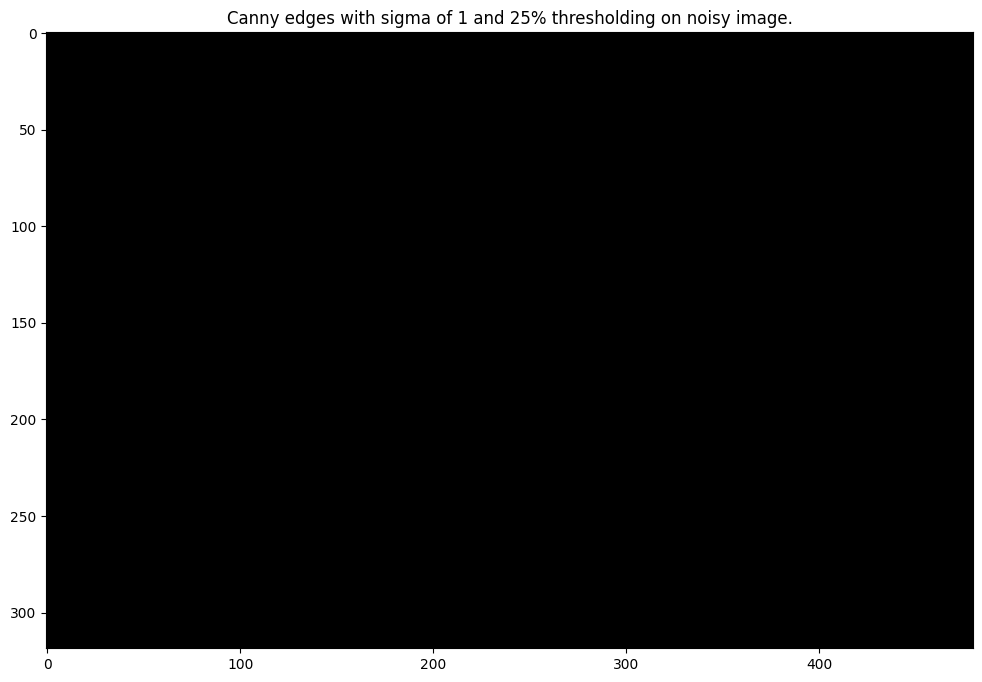

In [22]:

S = 50;
HT = 25;
noisy_church_canny = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);


fig = plt.figure(figsize = (16,8));
title = "Canny edges with sigma of 1 and 25% thresholding on noisy image.";
plt.imshow(noisy_church_canny, cmap="gray");
plt.title(title);

We will try extreme values of high threshold as weel, keeping $\sigma=1$ to isolate the problem:

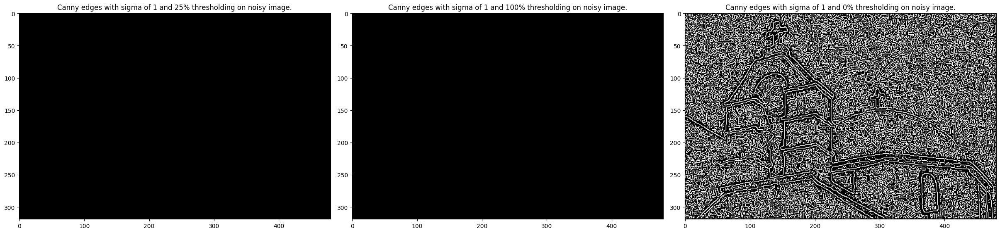

In [23]:
S = 1.0;
HT = 25;
noisy_church_canny_HT_25 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
HT = 100;
noisy_church_canny_HT_100 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
HT = 0;
noisy_church_canny_HT_0 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Canny edges with sigma of 1 and 25% thresholding on noisy image.";
axs[0].imshow(noisy_church_canny_HT_25, cmap="gray");
axs[0].set_title(title);
title = "Canny edges with sigma of 1 and 100% thresholding on noisy image.";
axs[1].imshow(noisy_church_canny_HT_100, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma of 1 and 0% thresholding on noisy image.";
axs[2].imshow(noisy_church_canny_HT_0, cmap="gray");
axs[2].set_title(title);

It seems that the threshold should be very low. Now, we move on to test for sigma values with a 0 threshold. 

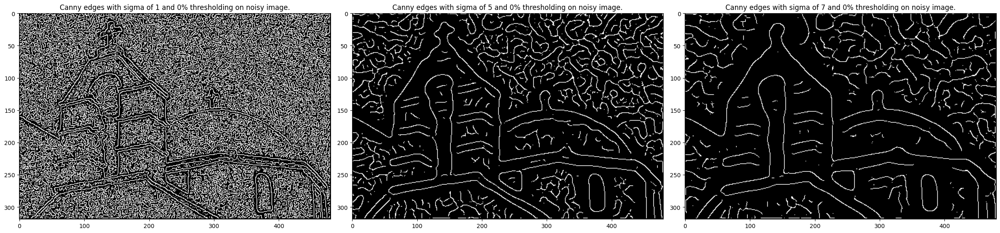

In [24]:
S = 1.0;
HT = 0;
noisy_church_canny_S_1 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
S = 5.0;
noisy_church_canny_S_5 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);
S = 7.0;
noisy_church_canny_S_7 = feature.canny(church_g, sigma=S, low_threshold=0.4*HT, high_threshold=HT);

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Canny edges with sigma of 1 and 0% thresholding on noisy image.";
axs[0].imshow(noisy_church_canny_S_1, cmap="gray");
axs[0].set_title(title);
title = "Canny edges with sigma of 5 and 0% thresholding on noisy image.";
axs[1].imshow(noisy_church_canny_S_5, cmap="gray");
axs[1].set_title(title);
title = "Canny edges with sigma of 7 and 0% thresholding on noisy image.";
axs[2].imshow(noisy_church_canny_S_7, cmap="gray");
axs[2].set_title(title);

The Canny algorithm is very vulnerable to Gaussian noise. It produces edges to some extent under noisy conditions. However, this is a hard tradeoff between artifacts and detailed edges. 